Сначала был сделан *Conditional GAN*, который долго обучался, поэтому в коде встречаются закомментированные куски кода на случай если я решу-таки сделать что-нибудь поинтереснее в дальнейшем

Импортируем модули и загрузим датасет

In [1]:
from IPython.display import clear_output
import numpy as np
import matplotlib.pyplot as plt
import time
import datetime
%matplotlib inline

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

from tensorflow.compat.v1.keras.layers import Dropout, BatchNormalization, Reshape, Flatten, RepeatVector
from tensorflow.compat.v1.keras.layers import Lambda, Dense, Input, Conv2D, MaxPool2D, UpSampling2D,concatenate,LeakyReLU
#from tensorflow.keras.layers.advanced_activations import LeakyReLU
from tensorflow.compat.v1.keras.models import Model, load_model
from tensorflow.compat.v1.keras import backend as K


from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical

Instructions for updating:
non-resource variables are not supported in the long term


Проверим температуру и загруженность *GPU*

In [19]:
!nvidia-smi

Mon May  4 00:49:34 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 440.33.01    CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce RTX 208...  On   | 00000000:01:00.0  On |                  N/A |
|  0%   37C    P8    21W / 250W |  10978MiB / 11018MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  GeForce RTX 208...  On   | 00000000:02:00.0 Off |                  N/A |
|  0%   34C    P8    21W / 250W |    167MiB / 11019MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
        

Разобьём датасет на трейн и тест

In [2]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_test  = x_test .astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))
x_test  = np.reshape(x_test,  (len(x_test),  28, 28, 1))

y_train_cat = to_categorical(y_train).astype(np.float32)
y_test_cat  = to_categorical(y_test).astype(np.float32)

Зарегистрируем *tensorflow* сессию в *keras*, чтобы работать с переменными в рамках данной сессии

In [3]:
sess = tf.Session()
K.set_session(sess)

Артефакт: на случай, если я захочу запустить это всё на *tensorflow 1* я просто раскомменчу некоторые строки

In [5]:
#from keras import backend as K
#import tensorflow as tf
#import tensorflow.compat.v1 as tf
#tf.disable_v2_behavior()

#sess = tf.Session()
#K.set_session(sess)
#sess = tf.compat.v1.Session()
#tf.compat.v1.keras.backend.set_session(sess)

Определим основные гиперпараметры

In [4]:
batch_size = 256
batch_shape = (batch_size, 28, 28, 1)
latent_dim = 4
num_classes = 10
dropout_rate = 0.3

Обучение модели из *tensorflow* $\Rightarrow$ батчи за нас никто не сделает. Ну что ж, напишем.

In [5]:
def gen_batch(x, y):
    n_batches = x.shape[0] // batch_size
    while(True):
        for i in range(n_batches):
            yield x[batch_size*i: batch_size*(i+1)], y[batch_size*i: batch_size*(i+1)]
        idxs = np.random.permutation(y.shape[0])
        x = x[idxs]
        y = y[idxs]


train_batches_it = gen_batch(x_train, y_train_cat)
test_batches_it  = gen_batch(x_test,  y_test_cat)

Создаём *placeholders* для входных данных, чтобы подать их на вход в *keras*

In [6]:
x_ = tf.placeholder(tf.float32, shape=(None, 28, 28, 1),   name='image')
y_ = tf.placeholder(tf.float32, shape=(None, num_classes), name='labels')
z_ = tf.placeholder(tf.float32, shape=(None, latent_dim),  name='z')

Напишем скоупы для кераса: первым имплементируем модель генератора

In [7]:
with tf.variable_scope('generator'):
#    x = concatenate([z, lbl])
    img = Input(tensor=x_)
    lbl = Input(tensor=y_)
    z   = Input(tensor=z_)
    x = Dense(7*7*64, activation='relu')(z)
    x = Dropout(dropout_rate)(x)
    x = Reshape((7, 7, 64))(x)
    x = UpSampling2D(size=(2, 2))(x)

    x = Conv2D(64, kernel_size=(5, 5), activation='relu', padding='same')(x)
    x = Dropout(dropout_rate)(x)

    x = Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = Dropout(dropout_rate)(x)
    x = UpSampling2D(size=(2, 2))(x)

    generated = Conv2D(1, kernel_size=(5, 5), activation='sigmoid', padding='same')(x)
#generator = Model([z, lbl], generated, name='generator')
generator = Model(z, generated, name='generator')
# Конечно же, саммари
generator.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "generator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 4)]               0         
_________________________________________________________________
dense (Dense)                (None, 3136)              15680     
_________________________________________________________________
dropout (Dropout)            (None, 3136)              0         
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 64)          0         
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 14, 14, 64)        102464    
__________________________________________

Очередь дискриминатора.

In [8]:
with tf.variable_scope('discrim'):
    x = Conv2D(128, kernel_size=(7, 7), strides=(2, 2), padding='same')(img)
#    x = add_units_to_conv2d(x, lbl)
    x = LeakyReLU()(x)
    x = Dropout(dropout_rate)(x)
    x = MaxPool2D((2, 2), padding='same')(x)
    
    l = Conv2D(128, kernel_size=(3, 3), padding='same')(x)
    x = LeakyReLU()(l)
    x = Dropout(dropout_rate)(x)

    h = Flatten()(x)
    d = Dense(1, activation='sigmoid')(h)
#discrim = Model([img, lbl], d, name='Discriminator')
discrim = Model(img, d, name='Discriminator')
# Конечно же, саммари
discrim.summary()

Model: "Discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 14, 14, 128)       6400      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 14, 14, 128)       0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 14, 14, 128)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 7, 7, 128)         147584    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 7, 7, 128)       

Соеденим модель. Тут видно, что можно применять модели сразу к *placeholder*, как обычную *tf*-операцию

In [9]:
#generated_z = generator([z, lbl])
generated_z = generator(z)

#discr_img   = discrim([img, lbl])
#discr_gen_z = discrim([generated_z, lbl])
discr_img   = discrim(img)
discr_gen_z = discrim(generated_z)


#gan_model = Model([z, lbl], discr_gen_z, name='GAN')
#gan   = gan_model([z, lbl])
gan_model = Model(z, discr_gen_z, name='GAN')
gan   = gan_model(z)

# Конечно же, саммари
gan_model.summary()

Model: "GAN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 4)]               0         
_________________________________________________________________
generator (Model)            (None, 28, 28, 1)         137409    
_________________________________________________________________
Discriminator (Model)        (None, 1)                 160257    
Total params: 297,666
Trainable params: 297,666
Non-trainable params: 0
_________________________________________________________________


Ещё немного гиперпараметров, на сей раз, тех, что нужны для нашей двойственной задачи

In [10]:
sigm = 1 
alph = 0.3 

Имплементация лоссов ошибки избражений - для реального и сгенерированного, плюс лоссы генератора и дискриминатора для них.

In [11]:
log_dis_img   = tf.reduce_mean(-tf.log(discr_img + 1e-10))

distr_updated = tf.reduce_mean(tf.exp(-tf.norm(generated_z - img) / (sigm * 0.09) ** 2))
z_updated     = distr_updated - alph * log_dis_img

log_dis_gen_z = tf.reduce_mean(-tf.log(1. - discr_gen_z + 1e-10))+\
                                tf.reduce_mean(z_updated - tf.reduce_mean(distr_updated - img) ** 2)

L_gen = -log_dis_gen_z
L_dis = 0.5*(log_dis_gen_z + log_dis_img)

Мы не хотим, чтобы оптимизатор смотрел на ошибку дискриминатора, для построения своего лосса вытащим переменные, по которым минимизирует оптимизатор: *tf.get_collection*

In [12]:
optimizer_gen = tf.train.RMSPropOptimizer(0.0003)
optimizer_dis = tf.train.RMSPropOptimizer(0.0001)

# Переменные генератора и дискриминаторы (отдельно) для оптимизаторов
generator_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, "generator")
discrim_vars   = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, "discrim")

step_gen = optimizer_gen.minimize(L_gen, var_list=generator_vars)
step_dis = optimizer_dis.minimize(L_dis, var_list=discrim_vars)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Запуск сессии инициализации переменных

In [14]:
sess.run(tf.global_variables_initializer())

Шаги генератора и дискриминатора

In [15]:
# Шаг генератора
#def step(image, label, zp):
def step(image, zp, i):
    l_dis, _ = sess.run([L_dis, step_gen], feed_dict={z:zp, img:image, K.learning_phase():1})
    #l_dis, _ = [L_dis, step_gen], feed_dict={z:zp, img:image, K.learning_phase():1}
    return l_dis

# Шаг дискриминатора
#def step_d(image, label, zp):
def step_d(image, zp):
    l_dis, _ = sess.run([L_dis, step_dis], feed_dict={z:zp, img:image, K.learning_phase():1})
    #l_dis, _ = [L_dis, step_dis], feed_dict={z:zp, img:image, K.learning_phase():1}
    return l_dis

Вспомогательный код для визуализации и сохранения картинок. Пригодится для гифки.

In [16]:
# Массивы в которые будем сохранять результаты, для последующей визуализации
figs = [] 
periods = []

save_periods = list(range(100)) + list(range(100, 1000, 10))

n = 15 # Картинка с 15x15 цифр
from scipy.stats import norm
# Так как сэмплируем из N(0, I), то сетку узлов, в которых генерируем цифры берем из обратной функции распределения
grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))

def draw_manifold(show=True):
    # Рисование цифр из многообразия
    figure = np.zeros((28 * n, 28 * n))
#    input_lbl = np.zeros((1, 10))
#    input_lbl[0, label] = 1.
    for i, yi in enumerate(grid_x):
        for j, xi in enumerate(grid_y):
            z_sample = np.zeros((1, latent_dim))
            z_sample[:, :2] = np.array([[xi, yi]])

            x_generated = sess.run(generated_z, feed_dict={z:z_sample, K.learning_phase():0})
#            x_generated = generated_z, feed_dict={z:z_sample, K.learning_phase():0}
            digit = x_generated[0].squeeze()
            figure[i * 28: (i + 1) * 28,
                   j * 28: (j + 1) * 28] = digit
    if show:
        # Визуализация
        #clear_output() # Не захламляем output
        plt.imshow(figure, cmap='Greys')
        plt.grid(False)
        ax = plt.gca()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        plt.show()
    return figure


n_compare = 10
def on_n_period(period):

    figs.append(draw_manifold(show = True))
    periods.append(period)
    # Рисование многообразия для рандомного y
    #draw_lbl = np.random.randint(0, num_classes)    
    #print(draw_lbl)
    #for label in range(num_classes):
    #    figs[label].append(draw_manifold(label, show=label==draw_lbl))

    #periods.append(period)

Обучим *GAN*. Внутренние циклы для *G* и *D* добавлены, чтобы дискриминатор не обучился в начале так, чтобы обучение остановилось. Условие выхода из внутренних циклов - когда сети "догоняют" друг друга.
___
Кривой вывод, ибо в *jupyter notebook* после очистки *output* мерцало изображение, что мешало оценить вывод модели. В *colab* можно просто раскомментить *clear_output()* в предыдущем селле и будет работать, как надо.

.

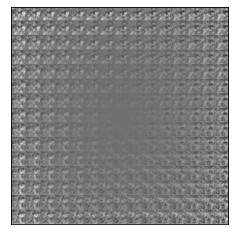

0.5795314 	 1 	 1 	 2020-05-03 23:29:53.138626 	 2020-05-04 01:39:50.138626
.....

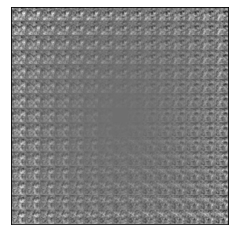

0.5766957 	 6 	 1 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:57:19.138626
.....

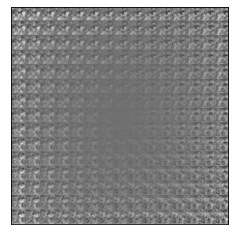

0.5724856 	 11 	 2 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:48:56.138626
.....

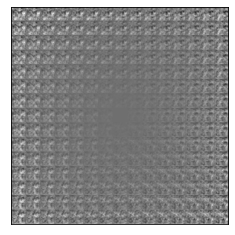

0.57356125 	 16 	 2 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:44:26.138626
.....

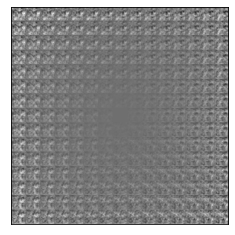

0.57435256 	 21 	 3 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:42:45.138626
.....

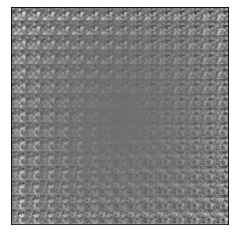

0.5698464 	 26 	 3 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:41:26.138626
.....

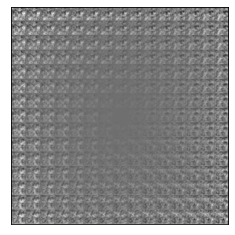

0.5702233 	 31 	 4 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:40:44.138626
.....

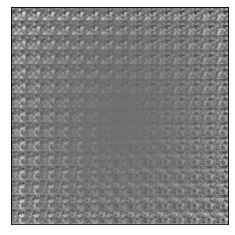

0.56782603 	 36 	 4 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:41:14.138626
.....

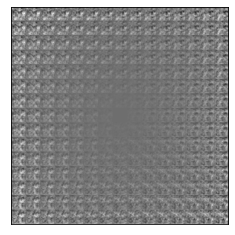

0.563719 	 41 	 5 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:40:31.138626
.....

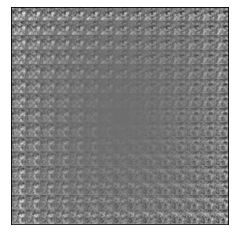

0.5594702 	 46 	 5 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:40:36.138626
.....

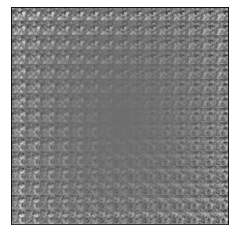

0.55463123 	 51 	 6 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:40:21.138626
.....

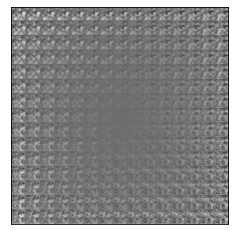

0.5429827 	 56 	 6 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:39:57.138626
.....

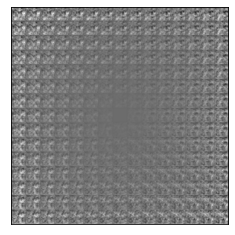

0.539462 	 61 	 7 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:39:37.138626
.....

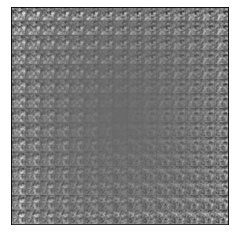

0.52706814 	 66 	 7 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:39:20.138626
.....

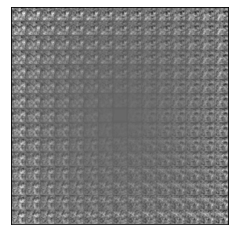

0.5104782 	 71 	 8 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:39:26.138626
.....

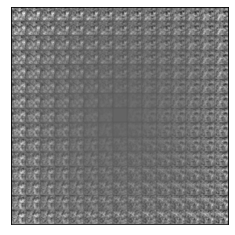

0.49901694 	 76 	 8 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:39:15.138626
.....

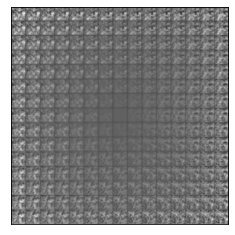

0.4836725 	 81 	 9 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:39:10.138626
.....

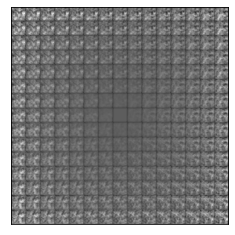

0.457364 	 86 	 9 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:54.138626
.....

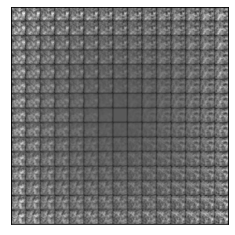

0.43264672 	 91 	 9 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:50.138626
.....

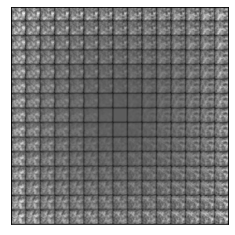

0.40540475 	 96 	 10 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:51.138626
.....

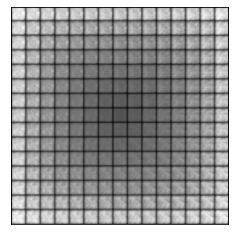

0.3946483 	 101 	 10 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:55.138626
.....

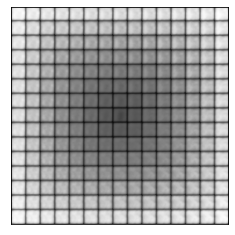

0.40113187 	 106 	 11 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:56.138626
.....

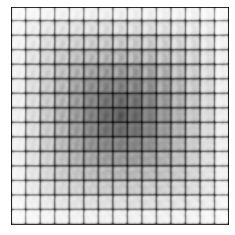

0.4220857 	 111 	 11 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:45.138626
.....

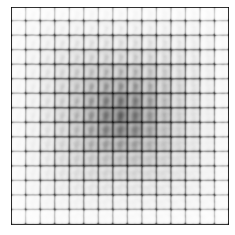

0.4251384 	 116 	 12 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:36.138626
.....

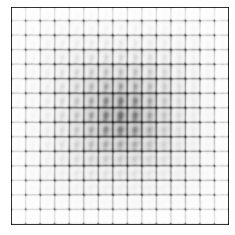

0.41364807 	 121 	 12 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:49.138626
.....

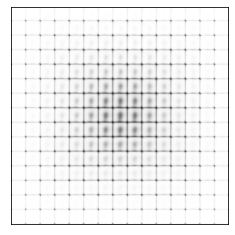

0.40269166 	 126 	 13 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:48.138626
.....

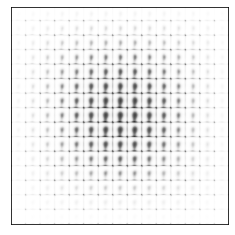

0.39311185 	 131 	 14 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:39:06.138626
.....

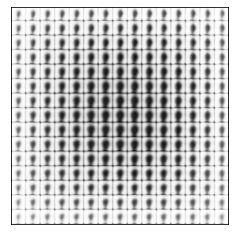

0.46860284 	 136 	 14 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:57.138626
.....

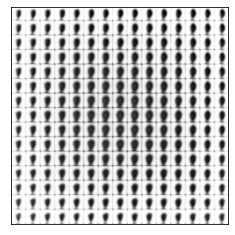

0.5105111 	 141 	 15 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:48.138626
.....

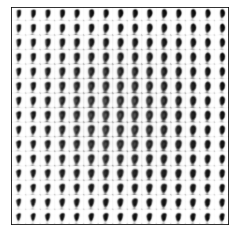

0.5167772 	 146 	 15 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:44.138626
.....

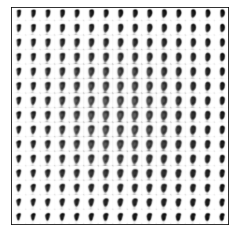

0.5042889 	 151 	 16 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:47.138626
.....

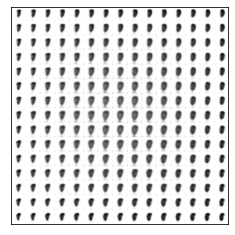

0.48102823 	 156 	 16 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:55.138626
.....

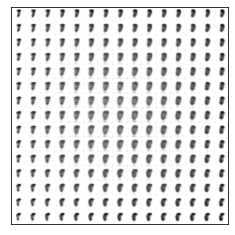

0.45942822 	 161 	 17 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:49.138626
.....

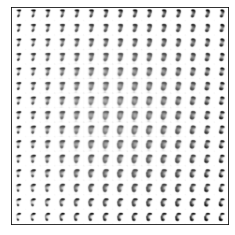

0.44723237 	 166 	 17 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:44.138626
.....

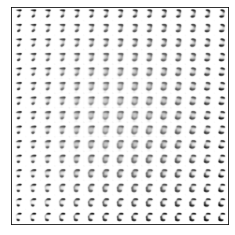

0.4493222 	 171 	 17 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:38.138626
.....

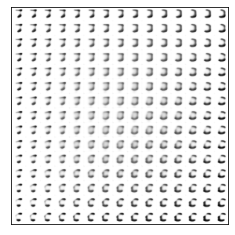

0.4583816 	 176 	 18 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:38.138626
.....

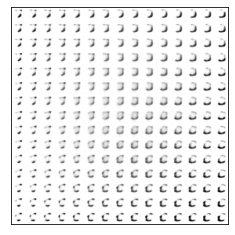

0.46526468 	 181 	 18 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:34.138626
.....

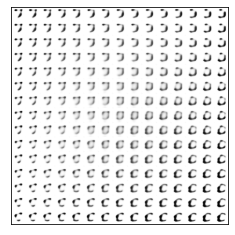

0.4735034 	 186 	 19 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:38.138626
.....

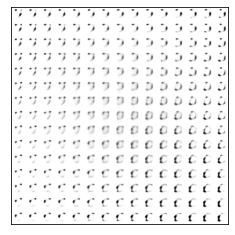

0.47932106 	 191 	 20 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:46.138626
.....

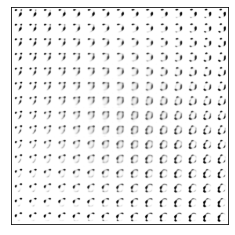

0.4752057 	 196 	 20 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:40.138626
.....

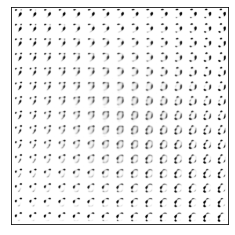

0.4701455 	 201 	 21 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:35.138626
.....

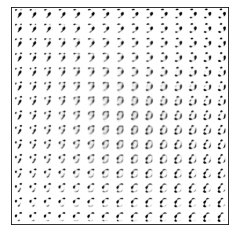

0.45328194 	 206 	 21 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:39.138626
.....

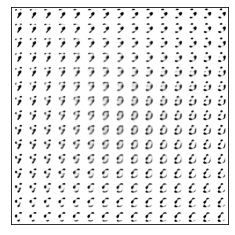

0.481265 	 211 	 21 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:34.138626
.....

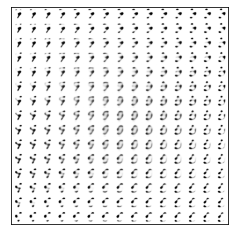

0.50116634 	 216 	 22 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:29.138626
.....

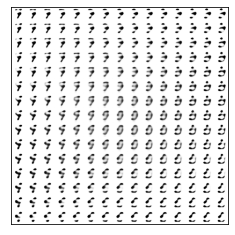

0.5173464 	 221 	 22 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:24.138626
.....

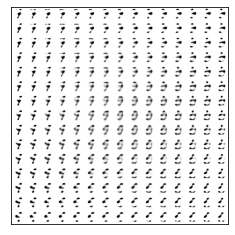

0.52996045 	 226 	 23 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:31.138626
.....

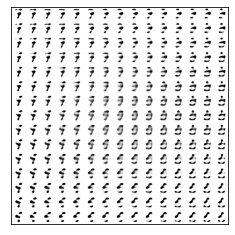

0.5098841 	 231 	 23 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:28.138626
.....

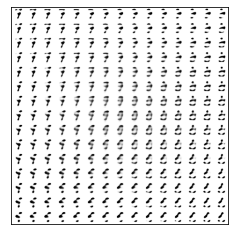

0.4989919 	 236 	 24 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:25.138626
.....

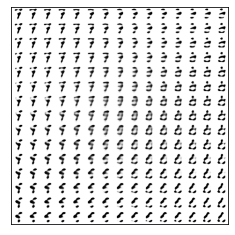

0.4697867 	 241 	 24 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:26.138626
.....

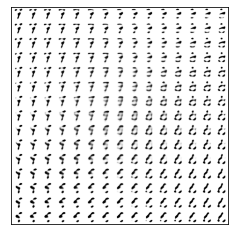

0.4901064 	 246 	 25 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:25.138626
.....

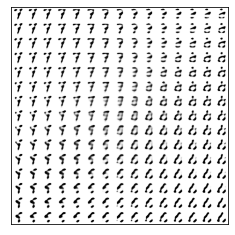

0.49023837 	 251 	 25 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:21.138626
.....

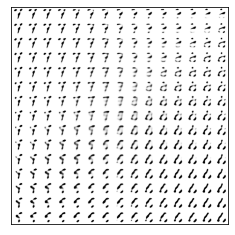

0.50537723 	 256 	 25 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:18.138626
.....

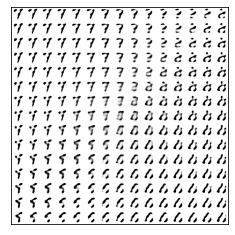

0.50986457 	 261 	 26 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:15.138626
.....

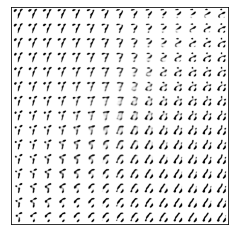

0.5090668 	 266 	 27 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:21.138626
.....

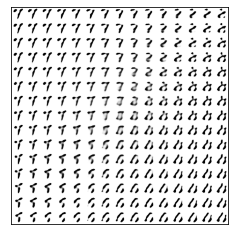

0.5097127 	 271 	 27 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:18.138626
.....

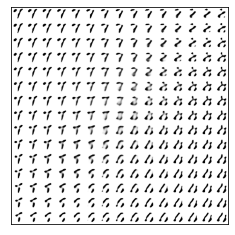

0.5089264 	 276 	 27 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:14.138626
.....

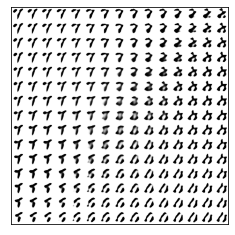

0.5135395 	 281 	 28 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:13.138626
.....

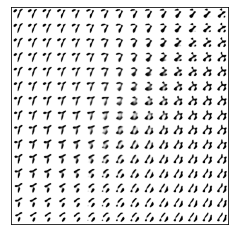

0.5078589 	 286 	 28 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:11.138626
.....

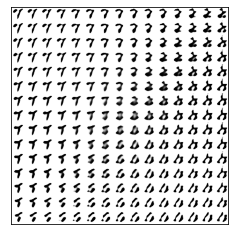

0.51043284 	 291 	 28 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:09.138626
.....

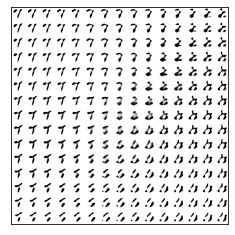

0.5180629 	 296 	 29 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:14.138626
.....

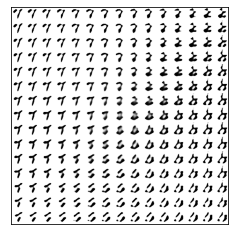

0.5069412 	 301 	 30 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:15.138626
.....

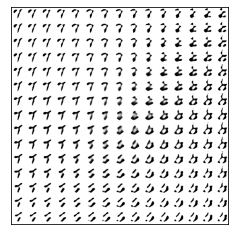

0.5329141 	 306 	 30 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:13.138626
.....

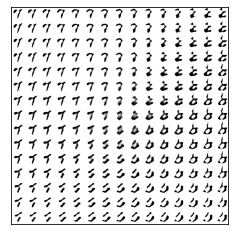

0.5292248 	 311 	 31 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:12.138626
.....

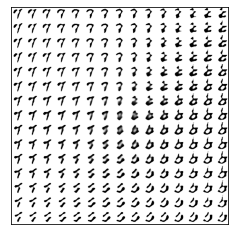

0.54061115 	 316 	 31 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:16.138626
.....

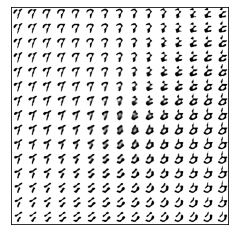

0.53113824 	 321 	 32 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:15.138626
.....

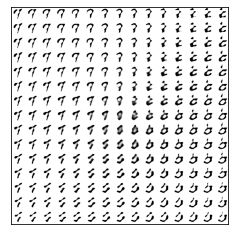

0.5361396 	 326 	 32 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:12.138626
.....

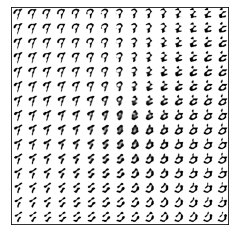

0.5394685 	 331 	 32 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:09.138626
.....

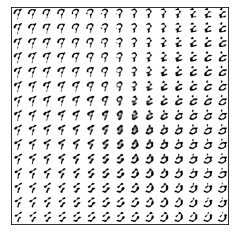

0.5230183 	 336 	 33 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:12.138626
.....

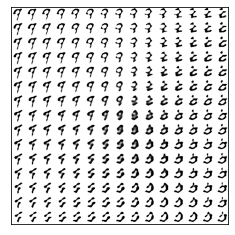

0.5432991 	 341 	 33 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:10.138626
.....

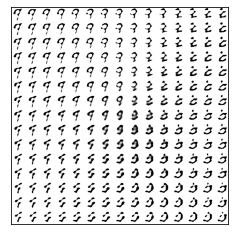

0.5391033 	 346 	 34 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:08.138626
.....

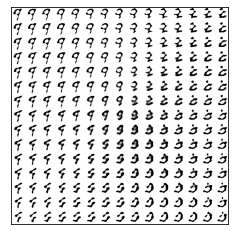

0.5475976 	 351 	 34 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:08.138626
.....

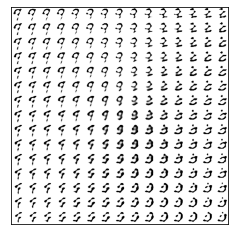

0.54989266 	 356 	 35 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:05.138626
.....

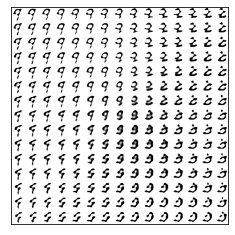

0.54264927 	 361 	 35 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:04.138626
.....

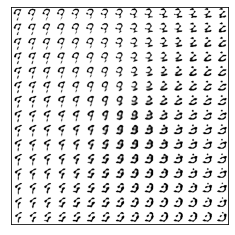

0.5512438 	 366 	 35 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:02.138626
.....

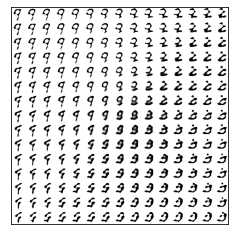

0.54805285 	 371 	 36 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:07.138626
.....

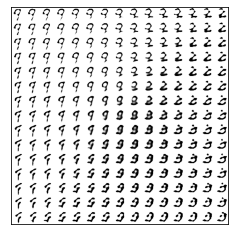

0.5497247 	 376 	 37 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:05.138626
.....

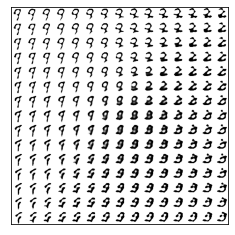

0.55770105 	 381 	 37 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:04.138626
.....

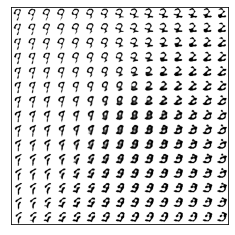

0.55114424 	 386 	 37 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:02.138626
.....

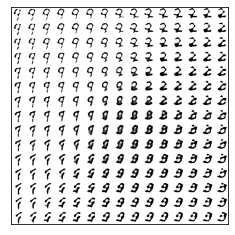

0.55448854 	 391 	 38 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:00.138626
.....

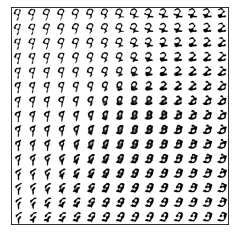

0.550737 	 396 	 38 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:58.138626
.....

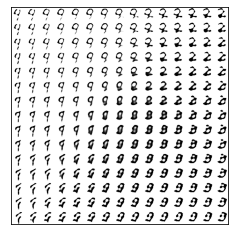

0.5622307 	 401 	 38 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:57.138626
.....

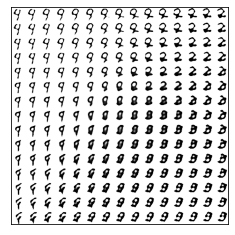

0.56177074 	 406 	 39 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:58.138626
.....

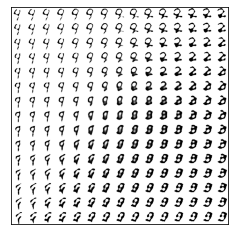

0.56987154 	 411 	 40 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:00.138626
.....

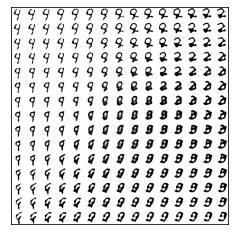

0.5609235 	 416 	 40 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:05.138626
.....

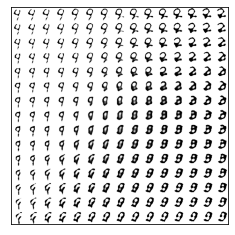

0.5684538 	 421 	 41 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:06.138626
.....

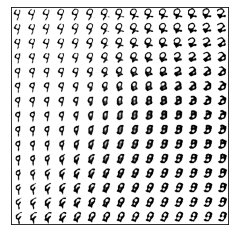

0.57423073 	 426 	 42 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:08.138626
.....

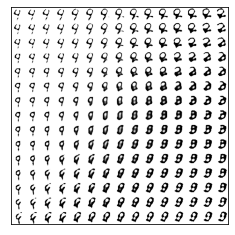

0.57457274 	 431 	 42 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:07.138626
.....

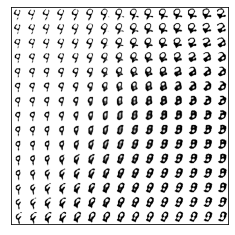

0.571293 	 436 	 42 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:05.138626
.....

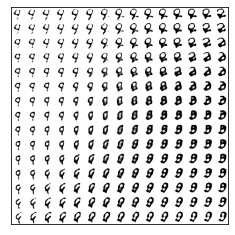

0.5705347 	 441 	 43 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:03.138626
.....

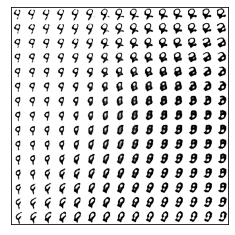

0.5660125 	 446 	 43 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:02.138626
.....

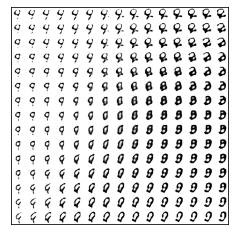

0.56505495 	 451 	 44 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:01.138626
.....

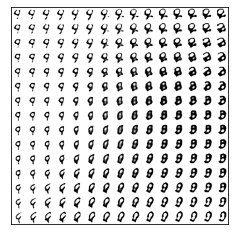

0.55839396 	 456 	 44 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:01.138626
.....

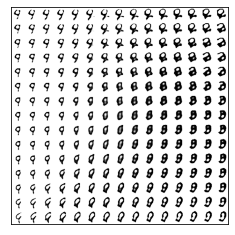

0.5592387 	 461 	 45 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:01.138626
.....

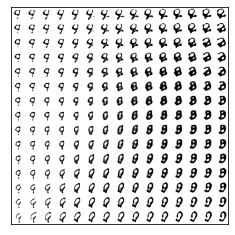

0.552473 	 466 	 45 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:04.138626
.....

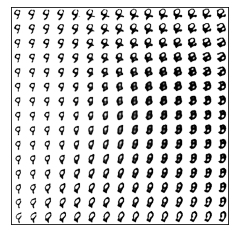

0.56319994 	 471 	 46 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:03.138626
.....

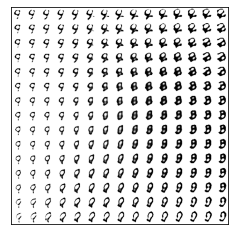

0.5547497 	 476 	 46 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:01.138626
.....

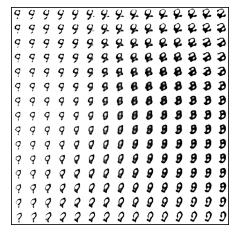

0.55055875 	 481 	 46 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:58.138626
.....

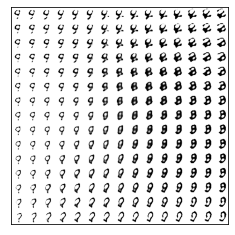

0.5558887 	 486 	 47 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:59.138626
.....

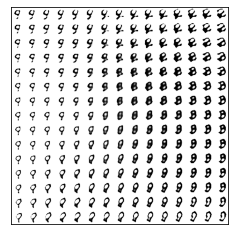

0.5531236 	 491 	 48 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:03.138626
.....

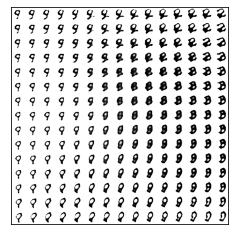

0.54411244 	 496 	 48 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:05.138626
.....

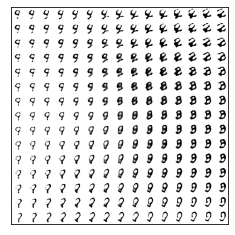

0.54459655 	 501 	 49 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:05.138626
.....0.54419863 	 506 	 49 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:38:01.138626
.....0.5449701 	 511 	 49 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:57.138626
.....0.54530585 	 516 	 49 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:54.138626
.....0.54481703 	 521 	 49 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:50.138626
.....0.5441717 	 526 	 49 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:47.138626
.....0.5460899 	 531 	 50 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:44.138626
.....0.53901803 	 536 	 50 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:41.138626
.....0.539245 	 541 	 50 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:37.138626
.....0.5421799 	 546 	 50 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:34.138626
.....

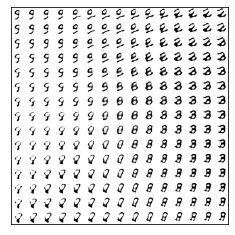

0.5412139 	 551 	 50 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:33.138626
.....0.54269856 	 556 	 50 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:29.138626
.....0.54422337 	 561 	 50 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:27.138626
.....0.53678465 	 566 	 51 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:24.138626
.....0.540528 	 571 	 51 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:21.138626
.....0.5414954 	 576 	 51 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:18.138626
.....0.5423538 	 581 	 51 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:15.138626
.....0.5387758 	 586 	 51 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:12.138626
.....0.54156774 	 591 	 51 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:09.138626
.....0.5411608 	 596 	 51 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:07.138626
.....

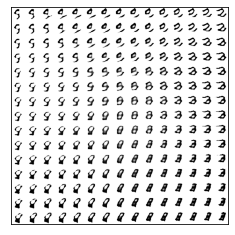

0.5404461 	 601 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:05.138626
.....0.53784436 	 606 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:03.138626
.....0.5397898 	 611 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:37:00.138626
.....0.5370439 	 616 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:58.138626
.....0.5368873 	 621 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:55.138626
.....0.5368761 	 626 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:53.138626
.....0.5371208 	 631 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:51.138626
.....0.5397142 	 636 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:48.138626
.....0.5328059 	 641 	 52 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:46.138626
.....0.53786373 	 646 	 53 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:44.138626
.....

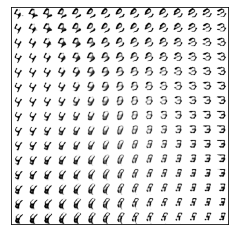

0.5380791 	 651 	 53 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:47.138626
.....0.5404322 	 656 	 54 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:45.138626
.....0.5381448 	 661 	 54 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:43.138626
.....0.5311813 	 666 	 54 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:41.138626
.....0.5330137 	 671 	 54 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:38.138626
.....0.5377553 	 676 	 54 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:37.138626
.....0.5367607 	 681 	 54 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:35.138626
.....0.5397484 	 686 	 54 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:32.138626
.....0.5375161 	 691 	 54 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:30.138626
.....0.5382511 	 696 	 55 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:28.138626
.....

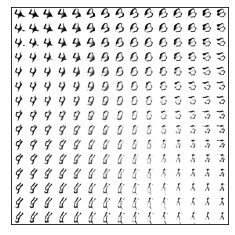

0.54035807 	 701 	 55 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:30.138626
.....0.53861934 	 706 	 55 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:27.138626
.....0.5398979 	 711 	 55 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:26.138626
.....0.54208463 	 716 	 56 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:24.138626
.....0.5403074 	 721 	 56 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:22.138626
.....0.5349307 	 726 	 56 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:20.138626
.....0.54169893 	 731 	 56 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:18.138626
.....0.53533804 	 736 	 56 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:16.138626
.....0.53281045 	 741 	 56 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:15.138626
.....0.5398339 	 746 	 56 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:13.138626
.....

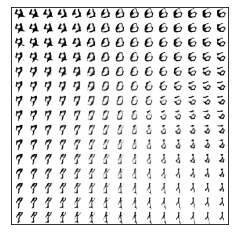

0.5334257 	 751 	 57 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:16.138626
.....0.53678876 	 756 	 57 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:14.138626
.....0.5355409 	 761 	 57 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:12.138626
.....0.53131217 	 766 	 57 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:11.138626
.....0.53284466 	 771 	 58 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:09.138626
.....0.5359124 	 776 	 58 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:07.138626
.....0.53483665 	 781 	 58 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:06.138626
.....0.53615344 	 786 	 58 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:04.138626
.....0.52921104 	 791 	 58 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:02.138626
.....0.53547096 	 796 	 58 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:01.138626
.....

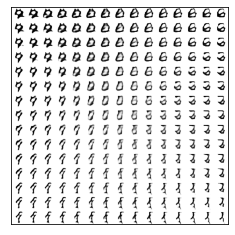

0.5308278 	 801 	 59 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:02.138626
.....0.5367837 	 806 	 59 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:36:01.138626
.....0.5415511 	 811 	 59 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:59.138626
.....0.53902775 	 816 	 59 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:58.138626
.....0.53044736 	 821 	 59 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:56.138626
.....0.5421553 	 826 	 59 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:55.138626
.....0.53469735 	 831 	 59 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:53.138626
.....0.53668725 	 836 	 60 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:52.138626
.....0.5354378 	 841 	 60 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:51.138626
.....0.54316044 	 846 	 60 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:49.138626
.....

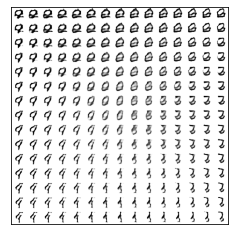

0.5342591 	 851 	 60 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:50.138626
.....0.53937835 	 856 	 61 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:49.138626
.....0.5419003 	 861 	 61 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:48.138626
.....0.53687596 	 866 	 61 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:46.138626
.....0.53624636 	 871 	 61 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:45.138626
.....0.53901374 	 876 	 61 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:44.138626
.....0.5479721 	 881 	 61 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:42.138626
.....0.54391557 	 886 	 61 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:41.138626
.....0.5427902 	 891 	 61 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:40.138626
.....0.5442199 	 896 	 62 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:39.138626
.....

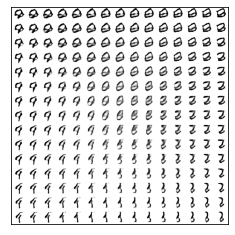

0.545166 	 901 	 62 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:40.138626
.....0.5361165 	 906 	 62 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:39.138626
.....0.543573 	 911 	 62 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:38.138626
.....0.5498099 	 916 	 62 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:36.138626
.....0.5461119 	 921 	 63 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:35.138626
.....0.54594314 	 926 	 63 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:34.138626
.....0.5455023 	 931 	 63 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:33.138626
.....0.54384494 	 936 	 63 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:32.138626
.....0.54667795 	 941 	 63 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:30.138626
.....0.54897285 	 946 	 63 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:29.138626
.....

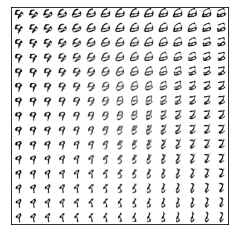

0.5508845 	 951 	 64 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:32.138626
.....0.54550785 	 956 	 64 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:31.138626
.....0.5476376 	 961 	 64 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:29.138626
.....0.55074054 	 966 	 64 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:28.138626
.....0.54645175 	 971 	 64 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:27.138626
.....0.54762566 	 976 	 65 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:26.138626
.....0.54316324 	 981 	 65 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:25.138626
.....0.5425253 	 986 	 65 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:24.138626
.....0.5424082 	 991 	 65 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:23.138626
.....0.54806757 	 996 	 65 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:22.138626
.....

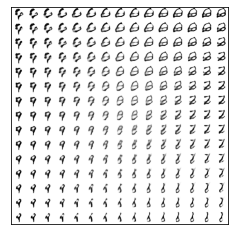

0.54542047 	 1001 	 66 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:23.138626
.....0.5486244 	 1006 	 66 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:22.138626
.....0.5479458 	 1011 	 66 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:21.138626
.....0.548215 	 1016 	 66 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:20.138626
.....0.54639184 	 1021 	 66 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:19.138626
.....0.5442107 	 1026 	 66 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:18.138626
.....0.5444808 	 1031 	 66 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:17.138626
.....0.5411632 	 1036 	 67 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:16.138626
.....0.5382136 	 1041 	 67 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:15.138626
.....0.5517691 	 1046 	 67 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:14.138626
.....

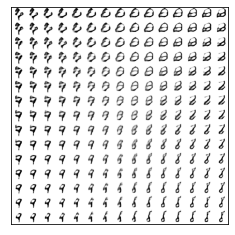

0.54299366 	 1051 	 67 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:15.138626
.....0.543982 	 1056 	 67 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:14.138626
.....0.5520481 	 1061 	 68 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:13.138626
.....0.5465085 	 1066 	 68 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:12.138626
.....0.5426692 	 1071 	 68 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:11.138626
.....0.5483261 	 1076 	 68 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:10.138626
.....0.54884577 	 1081 	 68 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:09.138626
.....0.54401684 	 1086 	 68 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:08.138626
.....0.5432226 	 1091 	 68 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:08.138626
.....0.5444678 	 1096 	 68 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:07.138626
.....

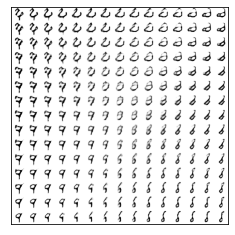

0.55203205 	 1101 	 69 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:07.138626
.....0.5423068 	 1106 	 69 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:06.138626
.....0.5490736 	 1111 	 69 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:05.138626
.....0.54725295 	 1116 	 69 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:04.138626
.....0.5480782 	 1121 	 69 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:04.138626
.....0.54423666 	 1126 	 69 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:03.138626
.....0.54543734 	 1131 	 70 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:02.138626
.....0.5480616 	 1136 	 70 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:01.138626
.....0.5468818 	 1141 	 70 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:00.138626
.....0.54941773 	 1146 	 70 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:00.138626
.....

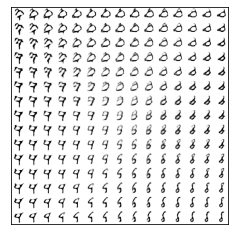

0.5482596 	 1151 	 70 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:00.138626
.....0.54487413 	 1156 	 70 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:35:00.138626
.....0.54122055 	 1161 	 71 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:59.138626
.....0.5475913 	 1166 	 71 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:58.138626
.....0.54527986 	 1171 	 71 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:57.138626
.....0.54596186 	 1176 	 71 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:56.138626
.....0.5377928 	 1181 	 71 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:55.138626
.....0.5406219 	 1186 	 71 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:55.138626
.....0.5450145 	 1191 	 71 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:54.138626
.....0.5509445 	 1196 	 71 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:53.138626
.....

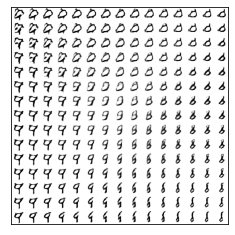

0.552899 	 1201 	 72 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:56.138626
.....0.55058295 	 1206 	 72 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:55.138626
.....0.54066944 	 1211 	 73 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:54.138626
.....0.5413585 	 1216 	 73 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:53.138626
.....0.5466969 	 1221 	 73 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:53.138626
.....0.53979003 	 1226 	 73 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:52.138626
.....0.5418548 	 1231 	 73 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:51.138626
.....0.5488003 	 1236 	 73 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:51.138626
.....0.55898625 	 1241 	 73 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:50.138626
.....0.5405529 	 1246 	 73 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:49.138626
.....

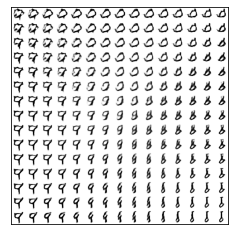

0.54400253 	 1251 	 74 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:50.138626
.....0.5522914 	 1256 	 74 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:49.138626
.....0.55091465 	 1261 	 74 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:48.138626
.....0.5412549 	 1266 	 74 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:48.138626
.....0.54703987 	 1271 	 74 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:47.138626
.....0.55532885 	 1276 	 74 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:46.138626
.....0.54706985 	 1281 	 75 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:45.138626
.....0.5455613 	 1286 	 75 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:45.138626
.....0.54342556 	 1291 	 75 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:44.138626
.....0.5481826 	 1296 	 75 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:44.138626
.....

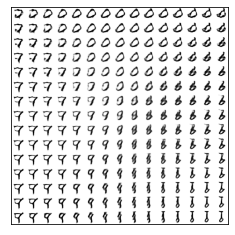

0.54559535 	 1301 	 75 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:44.138626
.....0.54579735 	 1306 	 75 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:43.138626
.....0.543096 	 1311 	 76 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:42.138626
.....0.5408463 	 1316 	 76 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:42.138626
.....0.5430497 	 1321 	 76 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:41.138626
.....0.545822 	 1326 	 76 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:41.138626
.....0.5466223 	 1331 	 76 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:40.138626
.....0.5418141 	 1336 	 76 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:39.138626
.....0.547403 	 1341 	 76 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:39.138626
.....0.5502126 	 1346 	 76 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:38.138626
.....

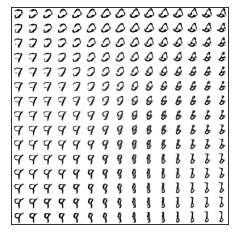

0.5461779 	 1351 	 77 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:39.138626
.....0.54655176 	 1356 	 77 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:38.138626
.....0.5482403 	 1361 	 77 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:37.138626
.....0.5465364 	 1366 	 77 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:37.138626
.....0.5474637 	 1371 	 77 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:36.138626
.....0.5540338 	 1376 	 77 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:36.138626
.....0.55185246 	 1381 	 78 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:35.138626
.....0.55155766 	 1386 	 78 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:35.138626
.....0.5510688 	 1391 	 78 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:34.138626
.....0.54859203 	 1396 	 78 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:34.138626
.....

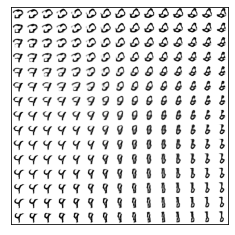

0.54998523 	 1401 	 79 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:35.138626
.....0.5454229 	 1406 	 79 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:34.138626
.....0.53941935 	 1411 	 79 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:34.138626
.....0.5461206 	 1416 	 79 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:33.138626
.....0.5497446 	 1421 	 79 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:33.138626
.....0.54618275 	 1426 	 79 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:32.138626
.....0.54883784 	 1431 	 79 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:31.138626
.....0.5453338 	 1436 	 79 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:31.138626
.....0.54801 	 1441 	 80 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:30.138626
.....0.5484811 	 1446 	 80 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:30.138626
.....

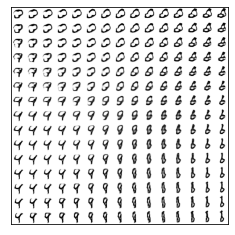

0.5454297 	 1451 	 80 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:30.138626
.....0.54697275 	 1456 	 80 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:30.138626
.....0.5453538 	 1461 	 80 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:29.138626
.....0.55152285 	 1466 	 80 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:29.138626
.....0.54868495 	 1471 	 81 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:28.138626
.....0.5516452 	 1476 	 81 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:28.138626
.....0.5480397 	 1481 	 81 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:27.138626
.....0.5460695 	 1486 	 81 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:27.138626
.....0.5403592 	 1491 	 81 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:26.138626
.....0.5475448 	 1496 	 81 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:26.138626
.....

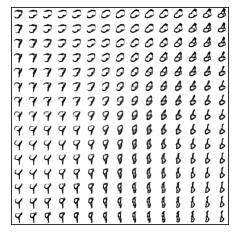

0.54533595 	 1501 	 82 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:26.138626
.....0.54373085 	 1506 	 82 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:26.138626
.....0.5397189 	 1511 	 82 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:25.138626
.....0.5488867 	 1516 	 82 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:25.138626
.....0.5432607 	 1521 	 82 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:24.138626
.....0.54813844 	 1526 	 82 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:24.138626
.....0.5501886 	 1531 	 82 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:23.138626
.....0.5468693 	 1536 	 83 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:23.138626
.....0.54432034 	 1541 	 83 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:22.138626
.....0.54260194 	 1546 	 83 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:22.138626
.....

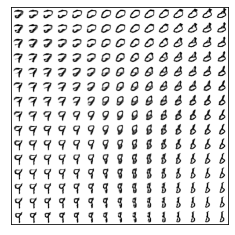

0.54729825 	 1551 	 83 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:23.138626
.....0.5383862 	 1556 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:23.138626
.....0.55148023 	 1561 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:22.138626
.....0.5461348 	 1566 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:22.138626
.....0.55096674 	 1571 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:21.138626
.....0.5456165 	 1576 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:21.138626
.....0.5420104 	 1581 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:20.138626
.....0.55153704 	 1586 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:20.138626
.....0.55003685 	 1591 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:19.138626
.....0.5533531 	 1596 	 84 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:19.138626
.....

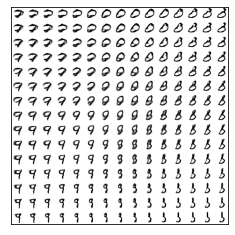

0.5452045 	 1601 	 85 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:19.138626
.....0.5458476 	 1606 	 85 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:18.138626
.....0.54939497 	 1611 	 85 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:18.138626
.....0.55933785 	 1616 	 85 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:18.138626
.....0.5499534 	 1621 	 85 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:17.138626
.....0.5489551 	 1626 	 85 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:17.138626
.....0.5467257 	 1631 	 86 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:16.138626
.....0.5490905 	 1636 	 86 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:16.138626
.....0.54882973 	 1641 	 86 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:16.138626
.....0.5475873 	 1646 	 86 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:15.138626
.....

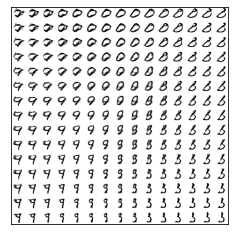

0.5505532 	 1651 	 86 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:15.138626
.....0.5429659 	 1656 	 86 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:15.138626
.....0.53565615 	 1661 	 87 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:14.138626
.....0.5458841 	 1666 	 87 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:14.138626
.....0.54732907 	 1671 	 87 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:14.138626
.....0.5493836 	 1676 	 87 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:13.138626
.....0.5457775 	 1681 	 87 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:13.138626
.....0.53984374 	 1686 	 87 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:12.138626
.....0.54497874 	 1691 	 87 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:12.138626
.....0.54592437 	 1696 	 87 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:12.138626
.....

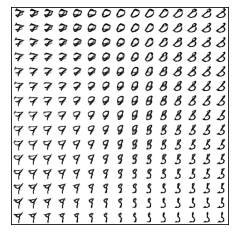

0.54748124 	 1701 	 88 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:13.138626
.....0.54223883 	 1706 	 88 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:13.138626
.....0.5367044 	 1711 	 89 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:13.138626
.....0.535688 	 1716 	 89 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:12.138626
.....0.54357547 	 1721 	 89 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:12.138626
.....0.54310024 	 1726 	 89 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:11.138626
.....0.5448313 	 1731 	 89 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:11.138626
.....0.5425763 	 1736 	 89 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:11.138626
.....0.54160094 	 1741 	 89 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:10.138626
.....0.54385585 	 1746 	 89 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:10.138626
.....

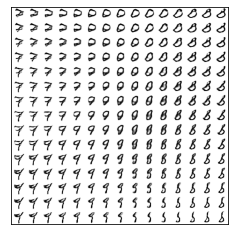

0.54358524 	 1751 	 90 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:10.138626
.....0.5517087 	 1756 	 90 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:10.138626
.....0.54251873 	 1761 	 90 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:09.138626
.....0.5392858 	 1766 	 90 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:09.138626
.....0.5424697 	 1771 	 90 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:08.138626
.....0.55419135 	 1776 	 90 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:08.138626
.....0.54477394 	 1781 	 90 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:08.138626
.....0.5475905 	 1786 	 90 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:07.138626
.....0.54770523 	 1791 	 91 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:07.138626
.....0.5453199 	 1796 	 91 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:06.138626
.....

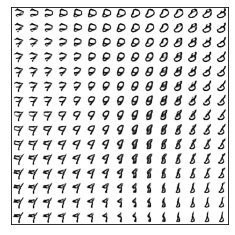

0.54229885 	 1801 	 92 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:08.138626
.....0.54389036 	 1806 	 92 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:08.138626
.....0.5386069 	 1811 	 92 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:07.138626
.....0.5471979 	 1816 	 92 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:07.138626
.....0.54235756 	 1821 	 92 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:07.138626
.....0.5500732 	 1826 	 92 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:06.138626
.....0.54914325 	 1831 	 92 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:06.138626
.....0.5559601 	 1836 	 92 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:06.138626
.....0.5490755 	 1841 	 93 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:05.138626
.....0.5506554 	 1846 	 93 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:05.138626
.....

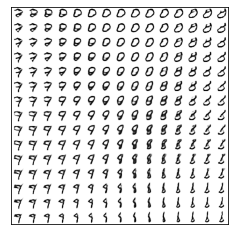

0.5488049 	 1851 	 93 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:05.138626
.....0.55067885 	 1856 	 93 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:05.138626
.....0.53961587 	 1861 	 93 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:05.138626
.....0.54917 	 1866 	 93 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:04.138626
.....0.5510955 	 1871 	 94 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:04.138626
.....0.5509741 	 1876 	 94 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:04.138626
.....0.5481448 	 1881 	 94 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:03.138626
.....0.5450169 	 1886 	 94 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:03.138626
.....0.55373156 	 1891 	 94 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:03.138626
.....0.54907393 	 1896 	 94 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:02.138626
.....

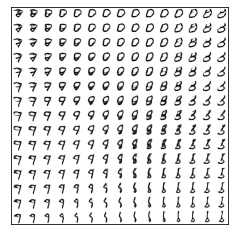

0.5476803 	 1901 	 95 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:03.138626
.....0.554716 	 1906 	 95 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:02.138626
.....0.5459515 	 1911 	 95 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:02.138626
.....0.55210966 	 1916 	 95 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:02.138626
.....0.55924034 	 1921 	 95 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:01.138626
.....0.5548829 	 1926 	 95 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:01.138626
.....0.5497441 	 1931 	 95 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:01.138626
.....0.5549292 	 1936 	 95 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:00.138626
.....0.55311525 	 1941 	 96 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:00.138626
.....0.5520184 	 1946 	 96 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:00.138626
.....

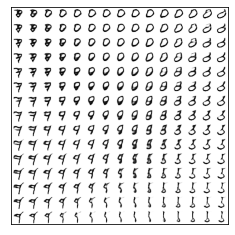

0.5516624 	 1951 	 96 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:00.138626
.....0.548224 	 1956 	 96 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:34:00.138626
.....0.55103886 	 1961 	 96 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:59.138626
.....0.5502396 	 1966 	 96 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:59.138626
.....0.5497793 	 1971 	 97 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:59.138626
.....0.54726845 	 1976 	 97 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:58.138626
.....0.5465751 	 1981 	 97 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:58.138626
.....0.5440472 	 1986 	 97 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:58.138626
.....0.55329126 	 1991 	 97 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:57.138626
.....0.55603546 	 1996 	 97 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:57.138626
.....

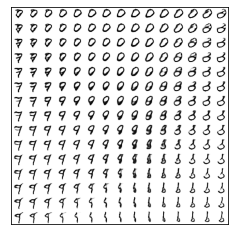

0.55066156 	 2001 	 98 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:57.138626
.....0.54860026 	 2006 	 98 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:57.138626
.....0.54254055 	 2011 	 98 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:57.138626
.....0.56021404 	 2016 	 98 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:57.138626
.....0.54438424 	 2021 	 98 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:56.138626
.....0.551523 	 2026 	 98 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:56.138626
.....0.5506309 	 2031 	 98 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:56.138626
.....0.5510349 	 2036 	 98 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.54275507 	 2041 	 99 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.5525509 	 2046 	 99 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....

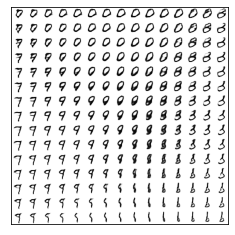

0.5508169 	 2051 	 99 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:56.138626
.....0.5463824 	 2056 	 100 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:56.138626
.....0.55174077 	 2061 	 100 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:56.138626
.....0.5505805 	 2066 	 100 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.5545276 	 2071 	 100 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.5506741 	 2076 	 100 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.55177134 	 2081 	 100 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.55186737 	 2086 	 100 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:54.138626
.....0.54817337 	 2091 	 100 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:54.138626
.....0.5460465 	 2096 	 101 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:54.138626
.....

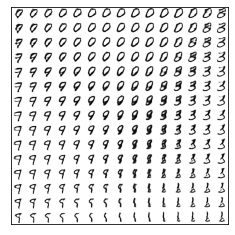

0.55334926 	 2101 	 102 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.54806596 	 2106 	 102 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.5473776 	 2111 	 102 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.55109286 	 2116 	 102 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:55.138626
.....0.550152 	 2121 	 102 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:54.138626
.....0.5507901 	 2126 	 102 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:54.138626
.....0.55271786 	 2131 	 102 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:54.138626
.....0.55102307 	 2136 	 102 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:53.138626
.....0.5572438 	 2141 	 103 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:53.138626
.....0.5482417 	 2146 	 103 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:53.138626
.....

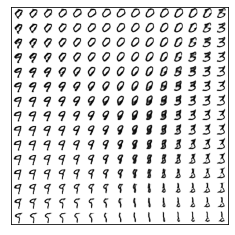

0.54757833 	 2151 	 103 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:54.138626
.....0.5546707 	 2156 	 103 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:54.138626
.....0.54774845 	 2161 	 104 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:53.138626
.....0.54995596 	 2166 	 104 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:53.138626
.....0.54837155 	 2171 	 104 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:53.138626
.....0.5459504 	 2176 	 104 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:53.138626
.....0.54605675 	 2181 	 104 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:52.138626
.....0.55141765 	 2186 	 104 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:52.138626
.....0.5481001 	 2191 	 104 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:52.138626
.....0.546962 	 2196 	 104 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:52.138626
.....

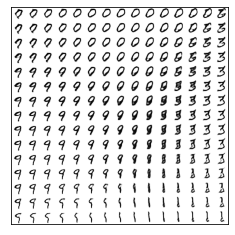

0.5521033 	 2201 	 105 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:52.138626
.....0.5541174 	 2206 	 105 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:51.138626
.....0.5398677 	 2211 	 105 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:51.138626
.....0.5541297 	 2216 	 105 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:51.138626
.....0.5541915 	 2221 	 105 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:51.138626
.....0.55342746 	 2226 	 105 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:50.138626
.....0.5499152 	 2231 	 106 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:50.138626
.....0.54857534 	 2236 	 106 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:50.138626
.....0.54890263 	 2241 	 106 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:50.138626
.....0.5443634 	 2246 	 106 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:49.138626
.....

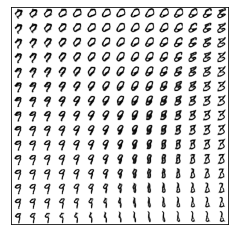

0.55010724 	 2251 	 107 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:50.138626
.....0.5504432 	 2256 	 107 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:50.138626
.....0.545993 	 2261 	 107 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:50.138626
.....0.5448731 	 2266 	 107 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:50.138626
.....0.54339886 	 2271 	 107 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:49.138626
.....0.54606587 	 2276 	 107 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:49.138626
.....0.54647005 	 2281 	 107 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:49.138626
.....0.55073905 	 2286 	 107 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:49.138626
.....0.542311 	 2291 	 108 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:48.138626
.....0.5459338 	 2296 	 108 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:48.138626
.....

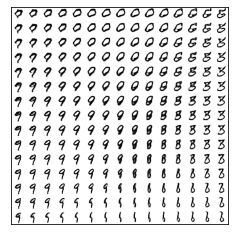

0.5428149 	 2301 	 108 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:49.138626
.....0.5505858 	 2306 	 108 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:49.138626
.....0.5487673 	 2311 	 109 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:48.138626
.....0.55081874 	 2316 	 109 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:48.138626
.....0.5445329 	 2321 	 109 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:48.138626
.....0.54945475 	 2326 	 109 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:48.138626
.....0.544953 	 2331 	 109 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:48.138626
.....0.54659635 	 2336 	 109 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:47.138626
.....0.55035216 	 2341 	 109 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:47.138626
.....0.5548259 	 2346 	 109 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:47.138626
.....

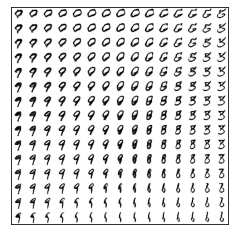

0.55237603 	 2351 	 110 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:47.138626
.....0.5490871 	 2356 	 110 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:47.138626
.....0.5541395 	 2361 	 110 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:46.138626
.....0.5462909 	 2366 	 110 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:46.138626
.....0.55427194 	 2371 	 110 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:46.138626
.....0.5437475 	 2376 	 110 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:46.138626
.....0.5473754 	 2381 	 110 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:45.138626
.....0.5480951 	 2386 	 111 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:45.138626
.....0.5484855 	 2391 	 111 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:45.138626
.....0.5534014 	 2396 	 111 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:45.138626
.....

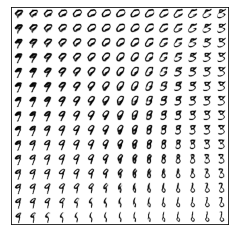

0.54871523 	 2401 	 111 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:45.138626
.....0.5497414 	 2406 	 111 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:45.138626
.....0.5548225 	 2411 	 112 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:45.138626
.....0.5542791 	 2416 	 112 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:45.138626
.....0.5510359 	 2421 	 112 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:44.138626
.....0.5406076 	 2426 	 112 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:44.138626
.....0.5493291 	 2431 	 112 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:44.138626
.....0.543144 	 2436 	 112 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:44.138626
.....0.5504473 	 2441 	 112 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:44.138626
.....0.5462085 	 2446 	 112 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:43.138626
.....

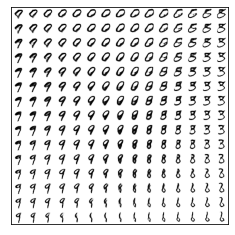

0.54737175 	 2451 	 113 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:44.138626
.....0.55061066 	 2456 	 113 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:44.138626
.....0.54620105 	 2461 	 113 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:44.138626
.....0.5530126 	 2466 	 113 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:43.138626
.....0.54653364 	 2471 	 114 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:43.138626
.....0.54849225 	 2476 	 114 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:43.138626
.....0.55325574 	 2481 	 114 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:43.138626
.....0.5454095 	 2486 	 114 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:43.138626
.....0.5476739 	 2491 	 114 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:42.138626
.....0.55287075 	 2496 	 114 	 2020-05-03 23:29:53.138626 	 2020-05-03 23:33:42.138626
.....

In [ ]:
batches_per_period = 5 # Как часто сохранять картинки
k_step = 5 # Количество шагов, которые могут делать дискриминатор и генератор во внутреннем цикле
t0 = time.time()
t0_oclock = datetime.datetime.now()
ran = 5000 # Количество шагов цикла

for i in range(ran):
    print('.', end='')
    # Достанем новый батч
    b0, b1 = next(train_batches_it)
    zp = np.random.randn(batch_size, latent_dim)
    # Шаги обучения дискриминатора
    for j in range(k_step):
#        l_d = step_d(b0, b1, zp)
        l_d = step_d(b0, zp)
        b0, b1 = next(train_batches_it)
        zp = np.random.randn(batch_size, latent_dim)
        if l_d < 1.0:
            break

#     Шаги обучения генератора
    for j in range(k_step):
#        l_d = step(b0, b1, zp)
        l_d = step(b0, zp, i)
        if l_d > 0.4:
            break
        b0, b1 = next(train_batches_it)
        zp = np.random.randn(batch_size, latent_dim)

    # Периодическое рисование результата
    if not i % batches_per_period:
        period = i // batches_per_period
        if period in save_periods:
            on_n_period(period)
        print(l_d,'\t', i + 1, '\t', int(time.time() - t0), '\t', t0_oclock, '\t',\
                                            t0_oclock + datetime.timedelta(seconds=int((time.time() - t0) / (i + 1) * ran)))

Создадим красивую гифку

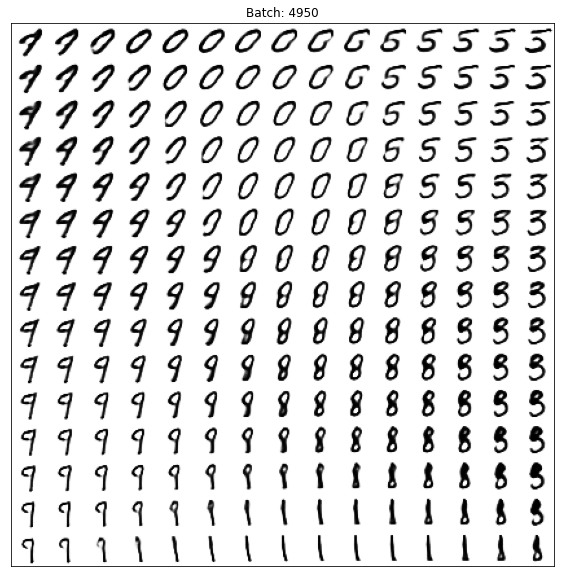

In [18]:
from matplotlib.animation import FuncAnimation
from matplotlib import cm
import matplotlib

def make_2d_figs_gif(figs, periods, fname, fig, batches_per_period): 
    norm = matplotlib.colors.Normalize(vmin=0, vmax=1, clip=False)
    im = plt.imshow(np.zeros((28,28)), cmap='Greys', norm=norm)
    plt.grid(None)
    plt.title("Batch: {}".format(0))

    def update(i):
        im.set_array(figs[i])
        im.axes.set_title("Batch: {}".format(periods[i]*batches_per_period))
        im.axes.get_xaxis().set_visible(False)
        im.axes.get_yaxis().set_visible(False)
        return im
    
    anim = FuncAnimation(fig, update, frames=range(len(figs)), interval=100)
    anim.save(fname, dpi=80, writer='imagemagick')

make_2d_figs_gif(figs, periods, "./figs/manifold.gif", plt.figure(figsize=(10,10)), batches_per_period)